### Computer Vision Final PBL Project Review
### Project Title : Pneumonia Detection and Analysis  Using Chest X-Ray Images
### Team Members : 
###                121B1B138 Vallabh Kulkarni
###               121B1B146 Prajwal Lonari
###                121B1B149 Sanika Mahabaleshwarkar

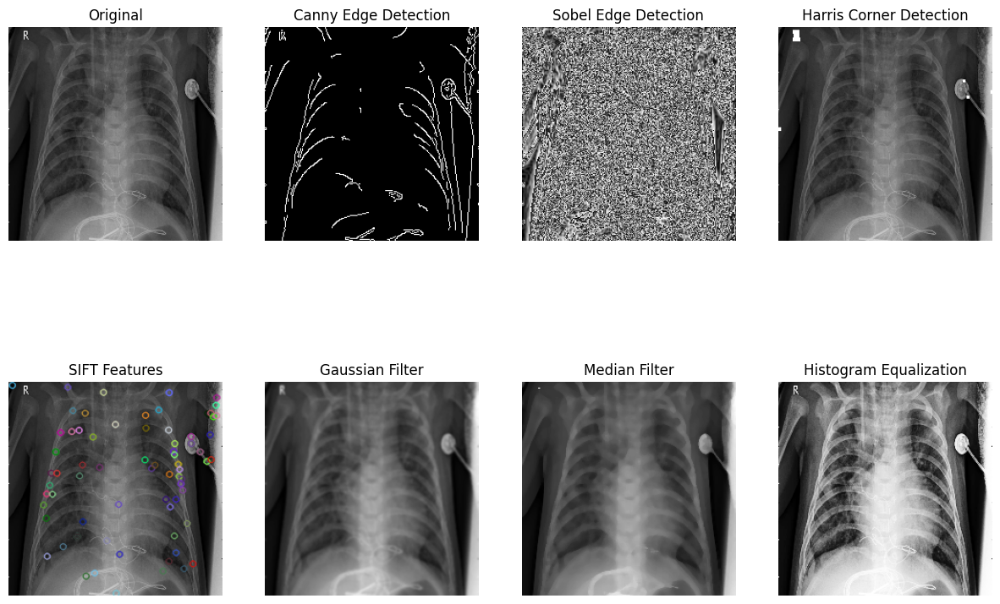

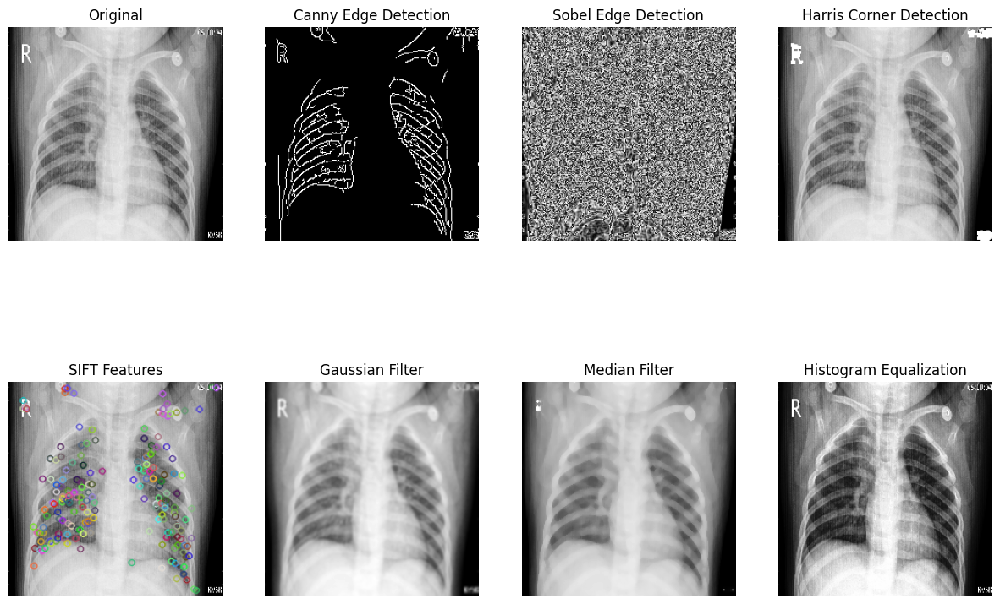

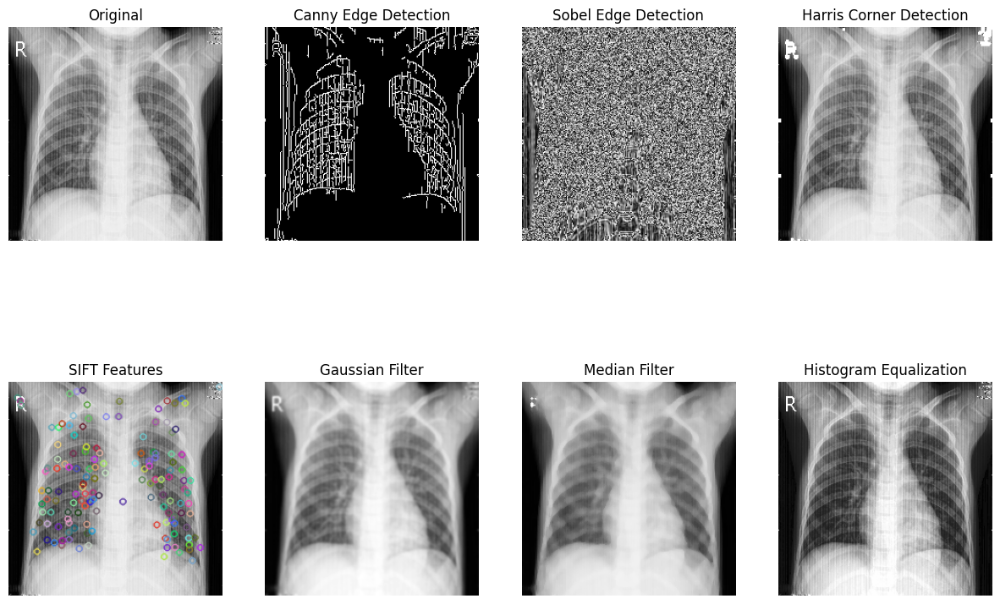

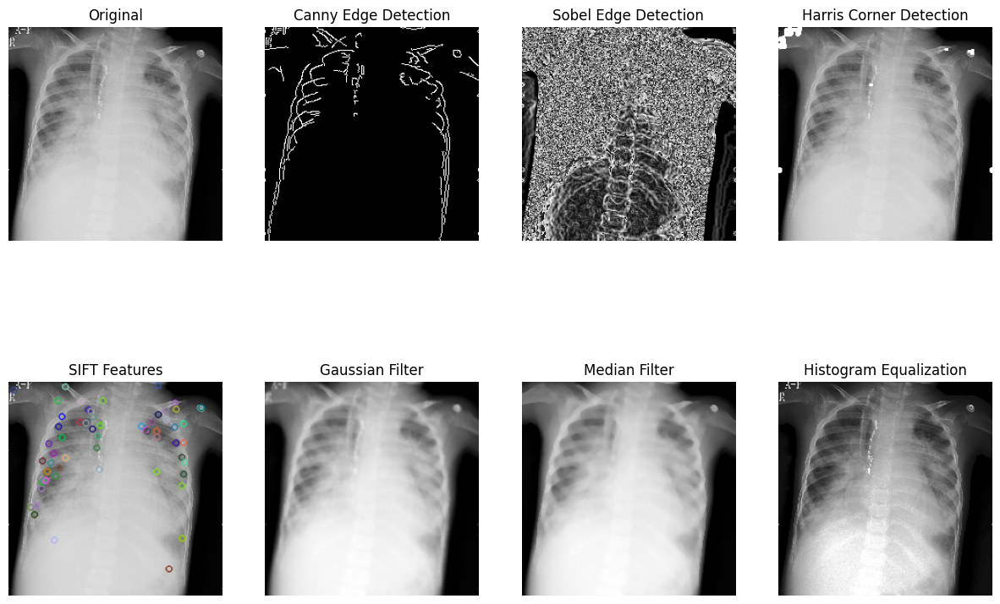

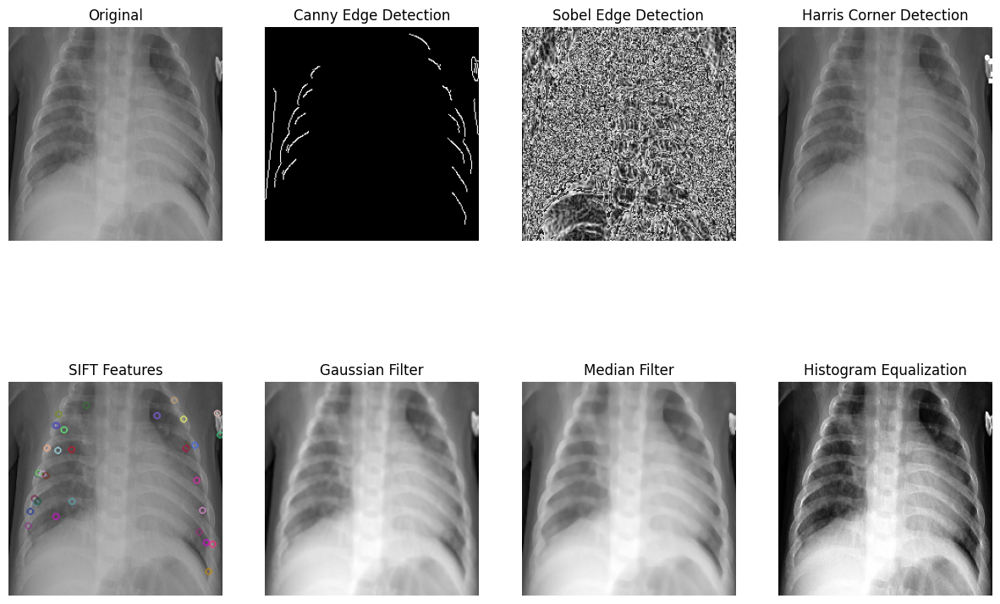

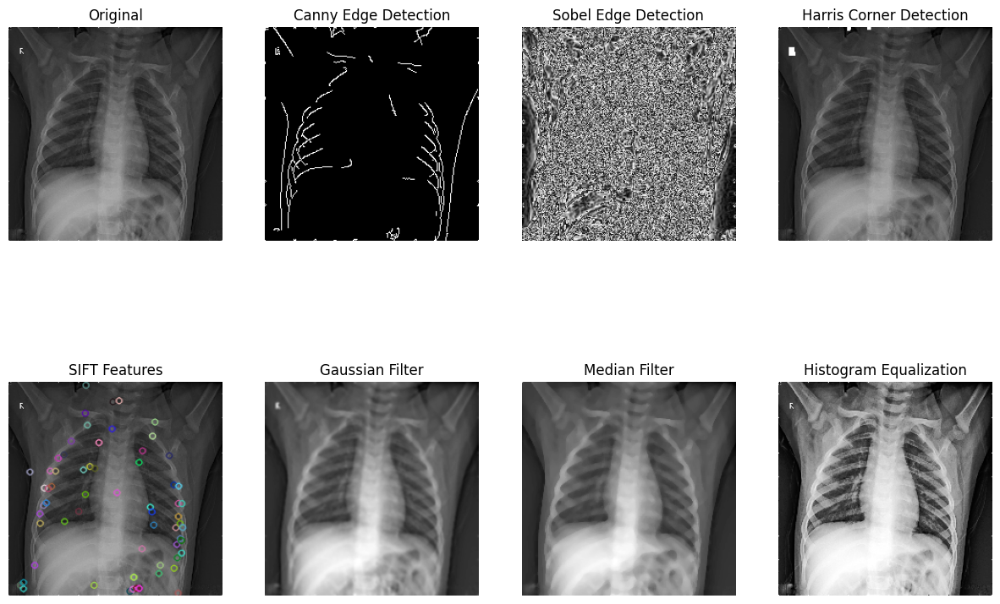

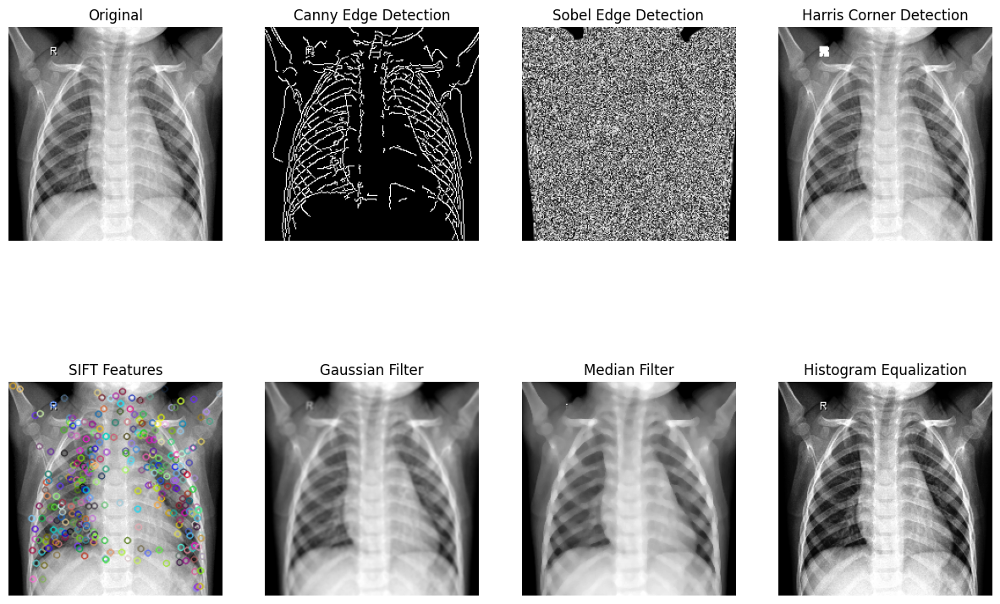

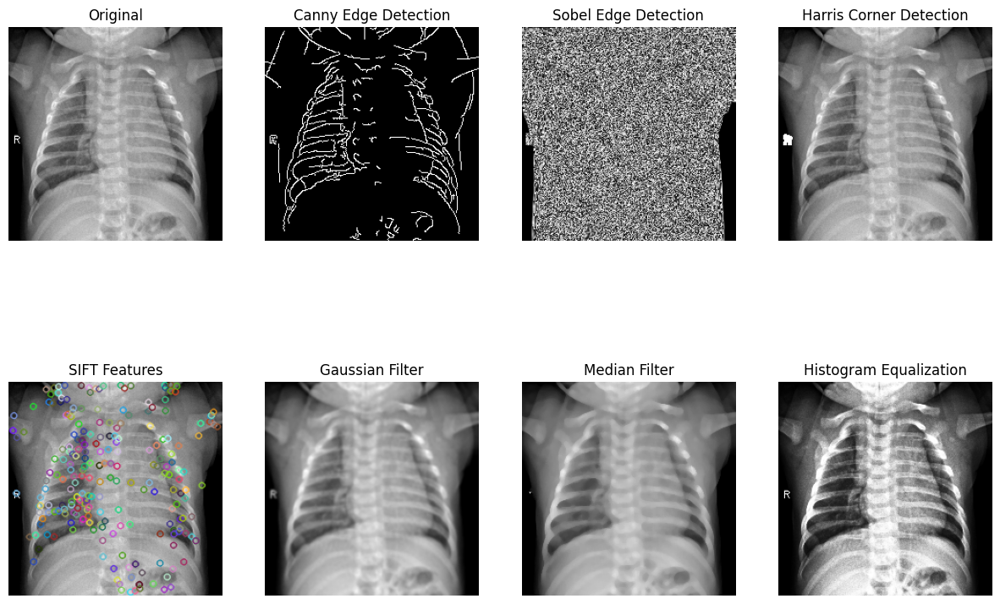

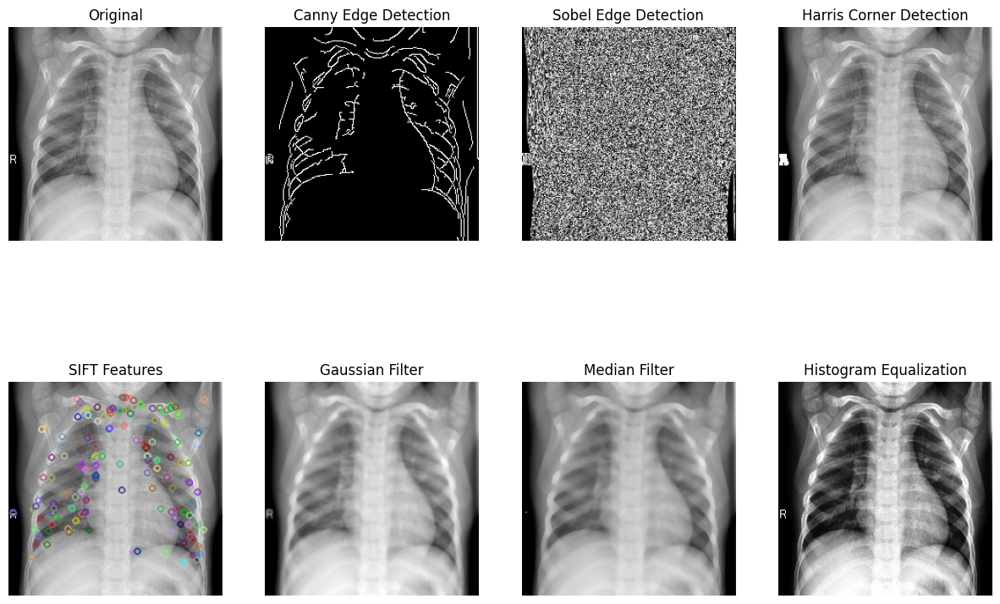

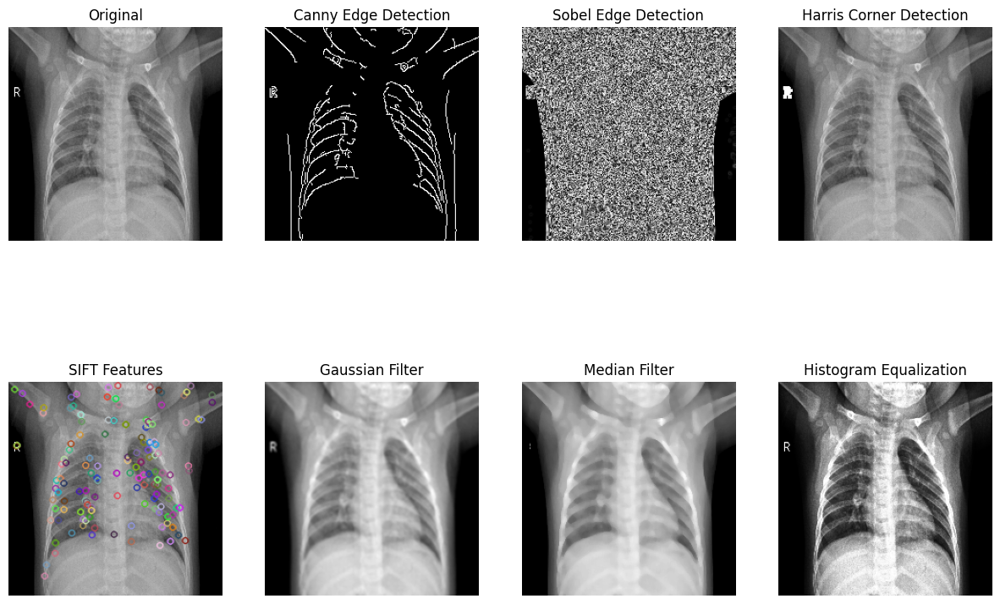

In [40]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings("ignore")


# Load and preprocess the dataset from the directory
def load_images_from_directory(directory, num_images = 10, img_size=(224, 224)):
    images = []
    labels = []
    
    pneumonia_dir = os.path.join(directory, 'PNEUMONIA')
    normal_dir = os.path.join(directory, 'NORMAL')
    
    for i, filename in enumerate(os.listdir(pneumonia_dir)):
        if i >= num_images:
            break
        img_path = os.path.join(pneumonia_dir, filename)
        img = cv2.imread(img_path)
        img = cv2.resize(img, img_size)  # Resize the image
        images.append(img)
        labels.append(1)  # Label 1 for pneumonia
    
    for i, filename in enumerate(os.listdir(normal_dir)):
        if i >= num_images:
            break
        img_path = os.path.join(normal_dir, filename)
        img = cv2.imread(img_path)
        img = cv2.resize(img, img_size)  # Resize the image
        images.append(img)
        labels.append(0)  # Label 0 for normal
    
    return np.array(images), np.array(labels)

# Canny Edge Detection
def canny_edge_detection(image_gray):
    edges = cv2.Canny(image_gray, 100, 200)
    return edges

# Sobel Edge Detection
def sobel_edge_detection(image_gray):
    sobelx = cv2.Sobel(image_gray, cv2.CV_64F, 1, 0, ksize=5)
    sobely = cv2.Sobel(image_gray, cv2.CV_64F, 0, 1, ksize=5)
    sobel = np.sqrt(sobelx**2 + sobely**2)
    sobel = np.uint8(np.absolute(sobel))  # Normalize for display
    return sobel

# Harris Corner Detection
def harris_corner_detection(image_gray):
    gray = np.float32(image_gray)
    dst = cv2.cornerHarris(gray, 2, 3, 0.04)
    dst = cv2.dilate(dst, None)
    image_gray[dst > 0.01 * dst.max()] = 255
    return image_gray

def apply_pca(image_gray):
    pca = PCA(n_components=1)  # Set to 1 for a single sample
    flat_image = image_gray.flatten()  # Flatten image
    pca_image = pca.fit_transform([flat_image])
    return pca_image

# SIFT Feature Detection
def sift_feature_detection(image_gray):
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(image_gray, None)
    img_sift = cv2.drawKeypoints(image_gray, keypoints, None)
    return img_sift

# Gaussian and Median Filters
def apply_filters(image_gray):
    gaussian_filtered = cv2.GaussianBlur(image_gray, (5, 5), 0)
    median_filtered = cv2.medianBlur(image_gray, 5)
    return gaussian_filtered, median_filtered

# Histogram Equalization
def histogram_equalization(image_gray):
    equalized = cv2.equalizeHist(image_gray)
    return equalized

# Display images
def display_images(titles, images):
    plt.figure(figsize=(15, 10))
    for i, (title, img) in enumerate(zip(titles, images)):
        plt.subplot(2, 4, i + 1)
        if len(img.shape) == 2:
            plt.imshow(img, cmap='gray')
        else:
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis('off')
    plt.show()

# Main function to apply all techniques
def process_image_dataset(directory, num_images=10):
    images, labels = load_images_from_directory(directory, num_images)

    for img in images:
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        # Apply techniques
        edges_canny = canny_edge_detection(img_gray)
        edges_sobel = sobel_edge_detection(img_gray)
        corners_harris = harris_corner_detection(img_gray.copy())
        pca_image = apply_pca(img_gray)
        img_sift = sift_feature_detection(img_gray)
        gaussian_filtered, median_filtered = apply_filters(img_gray)
        equalized_image = histogram_equalization(img_gray)

        # Display the results
        titles = [
            "Original", "Canny Edge Detection", "Sobel Edge Detection",
            "Harris Corner Detection", "SIFT Features",
            "Gaussian Filter", "Median Filter", "Histogram Equalization"
        ]
        images_to_show = [
            img, edges_canny, edges_sobel, corners_harris, 
            img_sift, gaussian_filtered, median_filtered, equalized_image
        ]
        display_images(titles, images_to_show)

# Run the process on the training dataset
process_image_dataset(train_dir, num_images=5)


In [2]:
# Directories for the PNEUMONIA class images
train_pneumonia_dir = '/kaggle/input/chest-xray-pneumonia/chest_xray/train/PNEUMONIA'
test_pneumonia_dir = '/kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA'
valid_pneumonia_dir = '/kaggle/input/chest-xray-pneumonia/chest_xray/val/PNEUMONIA'

target_size = (128, 128)
batch_size = 32


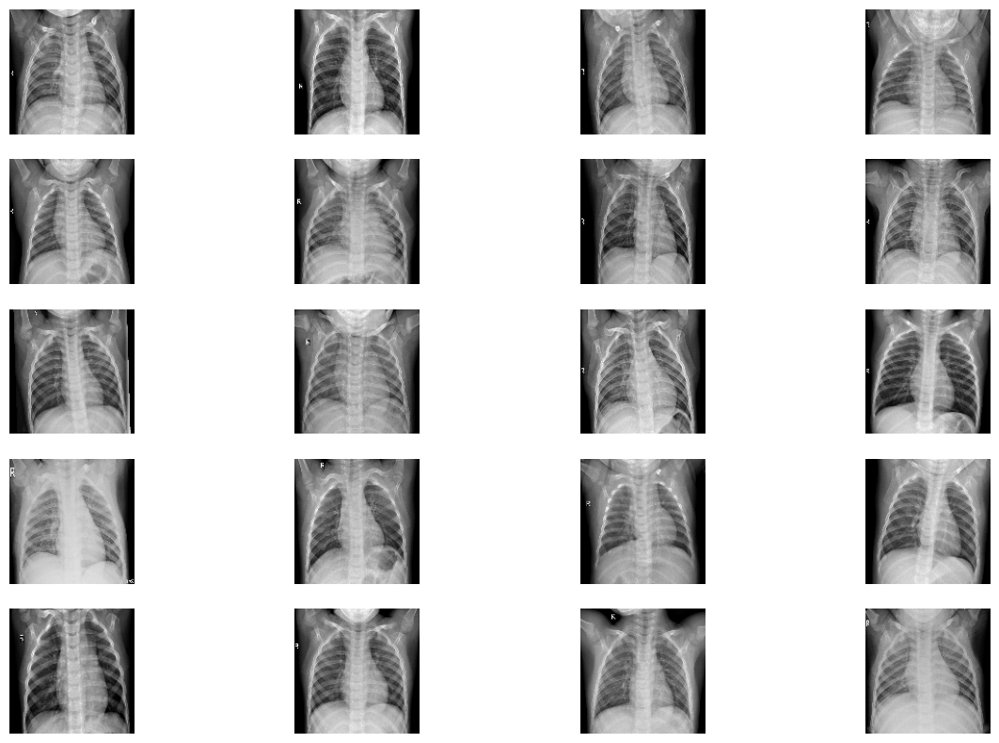

In [9]:
fig=plt.figure(figsize=(15, 10))
columns = 4; rows = 5
for i in range(1, columns*rows +1):
    img = cv2.imread(images[i])
    img = cv2.resize(img, (128, 128))
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    plt.axis(False)

In [19]:
generator = tf.keras.Sequential()

# First layer: Dense + BatchNorm + LeakyReLU, input shape is the noise vector (100,)
generator.add(layers.Dense(16 * 16 * 256, use_bias=False, input_shape=(100,)))
generator.add(layers.BatchNormalization())
generator.add(layers.LeakyReLU())

# Reshape the output to (16, 16, 256)
generator.add(layers.Reshape((16, 16, 256)))

# Layer 2: Upsample to (32, 32, 128) with Conv2DTranspose
generator.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
generator.add(layers.BatchNormalization())
generator.add(layers.LeakyReLU())

# Layer 3: Upsample to (64, 64, 64) with Conv2DTranspose
generator.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
generator.add(layers.BatchNormalization())
generator.add(layers.LeakyReLU())

# Layer 4: Upsample to (128, 128, 32) with Conv2DTranspose
generator.add(layers.Conv2DTranspose(32, (5, 5), strides=(2, 2), padding='same', use_bias=False))
generator.add(layers.BatchNormalization())
generator.add(layers.LeakyReLU())

# Final output layer: Conv2DTranspose to get the 128x128x3 RGB image
generator.add(layers.Conv2DTranspose(3, (5, 5), strides=(1, 1), padding='same', use_bias=False, activation='tanh'))

# Model summary
generator.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 65536)          │     6,553,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 65536)          │       262,144 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 65536)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 32, 32, 128)    │       819,200 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 64, 64, 64)     │       204,800 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 128, 128, 32)   │        51,200 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 128, 128, 3)    │         2,400 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,894,240 (30.11 MB)

 Trainable params: 7,762,720 (29.61 MB)

 Non-trainable params: 131,520 (513.75 KB)

In [20]:
discriminator = tf.keras.Sequential()

# First layer: Input shape (128, 128, 3) -> Downsample to (64, 64, 64)
discriminator.add(layers.Conv2D(64, kernel_size=4, strides=2, padding='same', input_shape=(128, 128, 3), use_bias=False))
discriminator.add(layers.LeakyReLU(0.2))

# Second layer: Downsample to (32, 32, 128)
discriminator.add(layers.Conv2D(128, kernel_size=4, strides=2, padding='same', use_bias=False))
discriminator.add(layers.BatchNormalization())
discriminator.add(layers.LeakyReLU(0.2))

# Third layer: Downsample to (16, 16, 256)
discriminator.add(layers.Conv2D(256, kernel_size=4, strides=2, padding='same', use_bias=False))
discriminator.add(layers.BatchNormalization())
discriminator.add(layers.LeakyReLU(0.2))

# Fourth layer: Downsample to (8, 8, 512)
discriminator.add(layers.Conv2D(512, kernel_size=4, strides=2, padding='same', use_bias=False))
discriminator.add(layers.BatchNormalization())
discriminator.add(layers.LeakyReLU(0.2))

# Fifth layer: Downsample to (4, 4, 512) and then to a single value
discriminator.add(layers.Conv2D(1, kernel_size=4, strides=1, padding='valid', use_bias=False))
discriminator.add(layers.Flatten())  # Flatten to a single output
discriminator.add(layers.Activation('sigmoid'))  # Binary classification (real or fake)

# Model summary
discriminator.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 64, 64, 64)     │         3,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 32, 32, 128)    │       131,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 16, 16, 256)    │       524,288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_6 (LeakyReLU)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 8, 8, 512)      │     2,097,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 8, 8, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 5, 5, 1)        │         8,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 25)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,767,360 (10.56 MB)

 Trainable params: 2,765,568 (10.55 MB)

 Non-trainable params: 1,792 (7.00 KB)

In [21]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

generator_optimizer = tf.keras.optimizers.Adam(0.001)
discriminator_optimizer = tf.keras.optimizers.Adam(0.0002)

In [22]:
@tf.function
def train_step(images, batch_size):
    noise = tf.random.normal([batch_size, 100])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss

In [23]:
def train(dataset, epochs, batch_size):
    """
    Trains the GAN model for a specified number of epochs.
    
    Parameters:
        dataset (tf.data.Dataset): The dataset containing real images, usually preprocessed and batched.
        epochs (int): Number of epochs to train the model.
        batch_size (int): The size of batches used during training.
    """
    g_losses,d_losses = [],[]
    for epoch in range(epochs):
        print(f"Epoch {epoch+1}/{epochs}")
        
        for image_batch in dataset:
            gen_loss, disc_loss = train_step(image_batch, batch_size)
            g_losses.append(gen_loss)
            d_losses.append(disc_loss)

        
        print(f"Generator Loss: {gen_loss}, Discriminator Loss: {disc_loss}")
        
        
        if (epoch + 1) % 50 == 0:  # Save model every 50 epochs
            generator.save(f'generator_epoch_{epoch+1}.h5')
            discriminator.save(f'discriminator_epoch_{epoch+1}.h5')
            
    return g_losses,d_losses

In [24]:
g_losses,d_losses = train(dataset, epochs=300, batch_size=batch_size)

Epoch 1/300
Generator Loss: 5.45484733581543, Discriminator Loss: 0.038343168795108795
Epoch 2/300
Generator Loss: 7.4795050621032715, Discriminator Loss: 0.005919167771935463
Epoch 3/300
Generator Loss: 5.237977981567383, Discriminator Loss: 0.1112549751996994
Epoch 4/300
Generator Loss: 0.3487343192100525, Discriminator Loss: 2.8069140911102295
Epoch 5/300
Generator Loss: 1.695753812789917, Discriminator Loss: 0.48727765679359436
Epoch 6/300
Generator Loss: 1.8989685773849487, Discriminator Loss: 0.5591340065002441
Epoch 7/300
Generator Loss: 5.897514820098877, Discriminator Loss: 0.021515201777219772
Epoch 8/300
Generator Loss: 4.542300701141357, Discriminator Loss: 0.28700870275497437
Epoch 9/300
Generator Loss: 4.035942554473877, Discriminator Loss: 0.11284847557544708
Epoch 10/300
Generator Loss: 1.0048291683197021, Discriminator Loss: 0.8768937587738037
Epoch 11/300
Generator Loss: 7.206557750701904, Discriminator Loss: 0.01899457350373268
Epoch 12/300
Generator Loss: 5.00582647

In [28]:
noise = tf.random.normal([10, 100])

In [29]:
images = generator(noise, training=False)

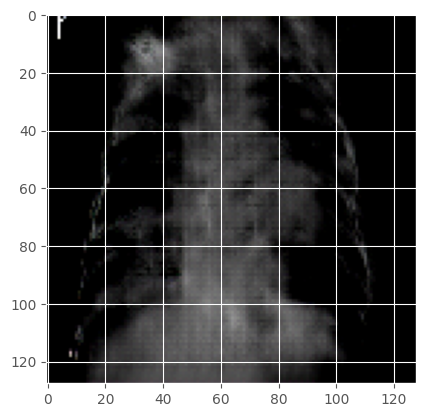

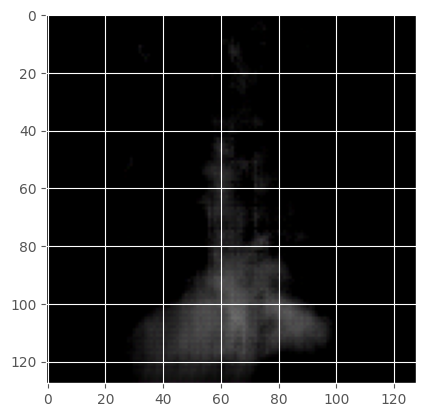

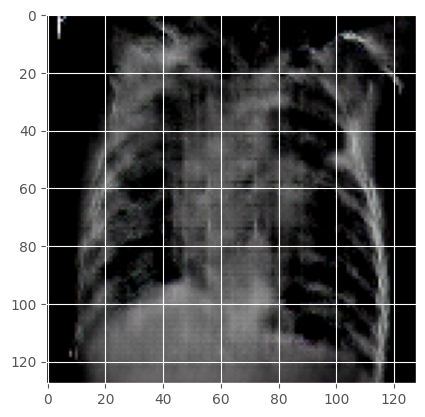

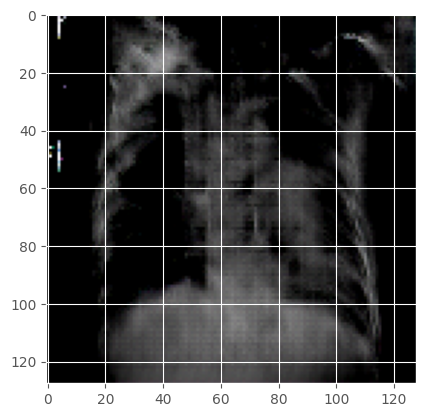

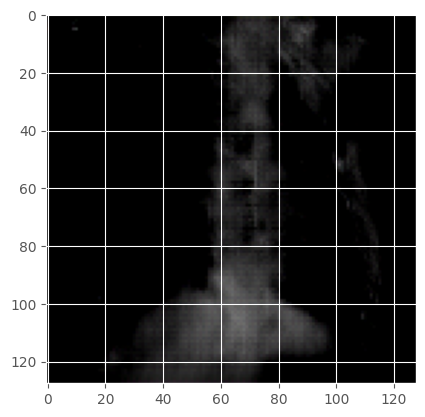

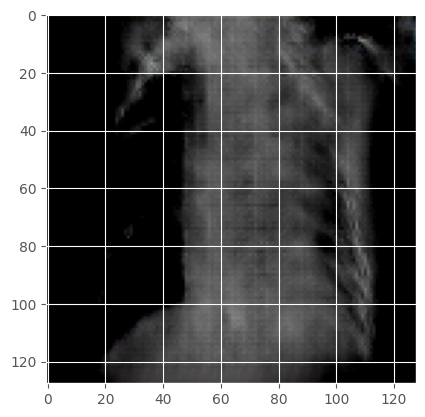

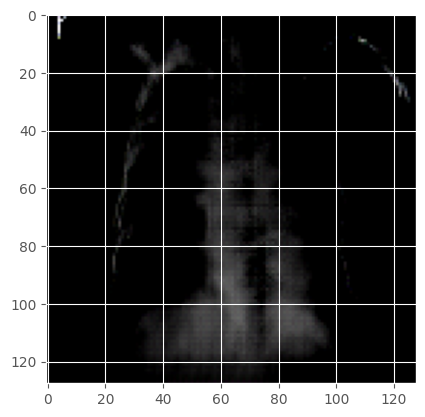

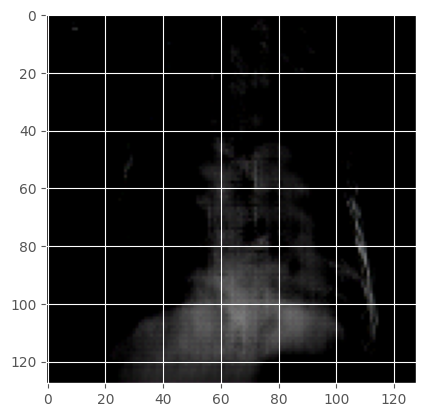

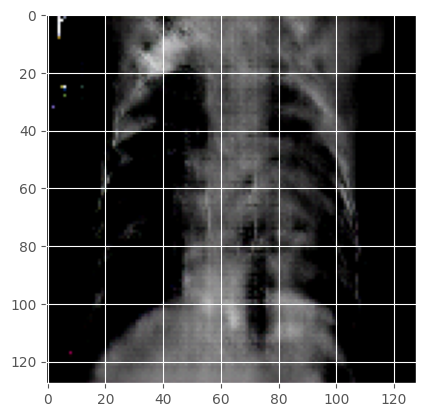

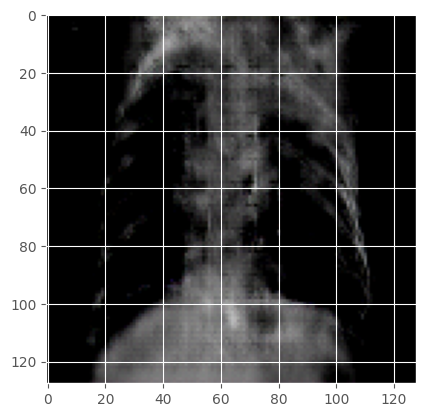

In [30]:
for image in images:
    plt.imshow(image.numpy().reshape(128,128, 3))
    plt.show()

## **Import Libraries**

In [1]:
import os
import shutil
import itertools
import pathlib
from PIL import Image

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd 
import seaborn as sns
sns.set_style('whitegrid')
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D , MaxPooling2D , Flatten , Activation , Dense , Dropout , BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras import regularizers

import warnings
warnings.filterwarnings('ignore')

2024-04-17 12:05:36.703393: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-17 12:05:36.703520: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-17 12:05:36.828997: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## **Data Preprocessing**

In [2]:
train_data_path = '/kaggle/input/chest-xray-pneumonia/chest_xray/train'
filepaths =[]
labels = []
folds = os.listdir(train_data_path)

for fold in folds:
    f_path = os.path.join(train_data_path , fold)
    filelists = os.listdir(f_path)
    
    for file in filelists:
        filepaths.append(os.path.join(f_path , file))
        labels.append(fold)
        
Fseries = pd.Series(filepaths , name = 'filepaths')
Lseries = pd.Series(labels , name = 'label')
df = pd.concat([Fseries , Lseries] , axis = 1)

In [3]:
df

,filepaths,label
0,/kaggle/input/chest-xray-pneumonia/chest_xray/...,PNEUMONIA
1,/kaggle/input/chest-xray-pneumonia/chest_xray/...,PNEUMONIA
2,/kaggle/input/chest-xray-pneumonia/chest_xray/...,PNEUMONIA
3,/kaggle/input/chest-xray-pneumonia/chest_xray/...,PNEUMONIA
4,/kaggle/input/chest-xray-pneumonia/chest_xray/...,PNEUMONIA
...,...,...
5211,/kaggle/input/chest-xray-pneumonia/chest_xray/...,NORMAL
5212,/kaggle/input/chest-xray-pneumonia/chest_xray/...,NORMAL
5213,/kaggle/input/chest-xray-pneumonia/chest_xray/...,NORMAL
5214,/kaggle/input/chest-xray-pneumonia/chest_xray/...,NORMAL


In [4]:
test_data_path = '/kaggle/input/chest-xray-pneumonia/chest_xray/test'

filepaths =[]
labels = []
folds = os.listdir(test_data_path)

for fold in folds:
    f_path = os.path.join(test_data_path , fold)
    filelists = os.listdir(f_path)
    
    for file in filelists:
        filepaths.append(os.path.join(f_path , file))
        labels.append(fold)
        
Fseries = pd.Series(filepaths , name = 'filepaths')
Lseries = pd.Series(labels , name = 'label')
test = pd.concat([Fseries , Lseries] , axis = 1)
test

,filepaths,label
0,/kaggle/input/chest-xray-pneumonia/chest_xray/...,PNEUMONIA
1,/kaggle/input/chest-xray-pneumonia/chest_xray/...,PNEUMONIA
2,/kaggle/input/chest-xray-pneumonia/chest_xray/...,PNEUMONIA
3,/kaggle/input/chest-xray-pneumonia/chest_xray/...,PNEUMONIA
4,/kaggle/input/chest-xray-pneumonia/chest_xray/...,PNEUMONIA
...,...,...
619,/kaggle/input/chest-xray-pneumonia/chest_xray/...,NORMAL
620,/kaggle/input/chest-xray-pneumonia/chest_xray/...,NORMAL
621,/kaggle/input/chest-xray-pneumonia/chest_xray/...,NORMAL
622,/kaggle/input/chest-xray-pneumonia/chest_xray/...,NORMAL


In [5]:
valid_data_path = '/kaggle/input/chest-xray-pneumonia/chest_xray/valid'

filepaths =[]
labels = []
folds = os.listdir(test_data_path)

for fold in folds:
    f_path = os.path.join(test_data_path , fold)
    filelists = os.listdir(f_path)
    
    for file in filelists:
        filepaths.append(os.path.join(f_path , file))
        labels.append(fold)
        
Fseries = pd.Series(filepaths , name = 'filepaths')
Lseries = pd.Series(labels , name = 'label')
valid = pd.concat([Fseries , Lseries] , axis = 1)
valid

,filepaths,label
0,/kaggle/input/chest-xray-pneumonia/chest_xray/...,PNEUMONIA
1,/kaggle/input/chest-xray-pneumonia/chest_xray/...,PNEUMONIA
2,/kaggle/input/chest-xray-pneumonia/chest_xray/...,PNEUMONIA
3,/kaggle/input/chest-xray-pneumonia/chest_xray/...,PNEUMONIA
4,/kaggle/input/chest-xray-pneumonia/chest_xray/...,PNEUMONIA
...,...,...
619,/kaggle/input/chest-xray-pneumonia/chest_xray/...,NORMAL
620,/kaggle/input/chest-xray-pneumonia/chest_xray/...,NORMAL
621,/kaggle/input/chest-xray-pneumonia/chest_xray/...,NORMAL
622,/kaggle/input/chest-xray-pneumonia/chest_xray/...,NORMAL


### All the images in class pneumonia in greater than class normal in the train, test and validation data frames

In [9]:
train_df, dummy_df = train_test_split(df, train_size=0.8, shuffle= True, random_state= 42)
valid_df, test_df= train_test_split(dummy_df, train_size= 0.6, shuffle= True, random_state= 42)

## **Image Data Generator**

In [10]:
img_size = (224 ,224)
batch_size = 16
img_shape= (img_size[0], img_size[1], 3)

def scalar(img):
    return img

tr_gen = ImageDataGenerator(preprocessing_function= scalar)
ts_gen = ImageDataGenerator(preprocessing_function= scalar)

train_gen = tr_gen.flow_from_dataframe(train_df , x_col = 'filepaths' , y_col = 'label' , target_size = img_size ,
                                      class_mode = 'categorical' , color_mode = 'rgb' , shuffle = True , batch_size =batch_size)
valid_gen = ts_gen.flow_from_dataframe(valid_df , x_col = 'filepaths' , y_col = 'label' , target_size = img_size , 
                                       class_mode = 'categorical',color_mode = 'rgb' , shuffle= True, batch_size = batch_size)
test_gen = ts_gen.flow_from_dataframe(test_df , x_col= 'filepaths' , y_col = 'label' , target_size = img_size , 
                                      class_mode = 'categorical' , color_mode= 'rgb' , shuffle = False , batch_size = batch_size)

Found 4172 validated image filenames belonging to 2 classes.
Found 626 validated image filenames belonging to 2 classes.
Found 418 validated image filenames belonging to 2 classes.


## **Show Sample from the train data**

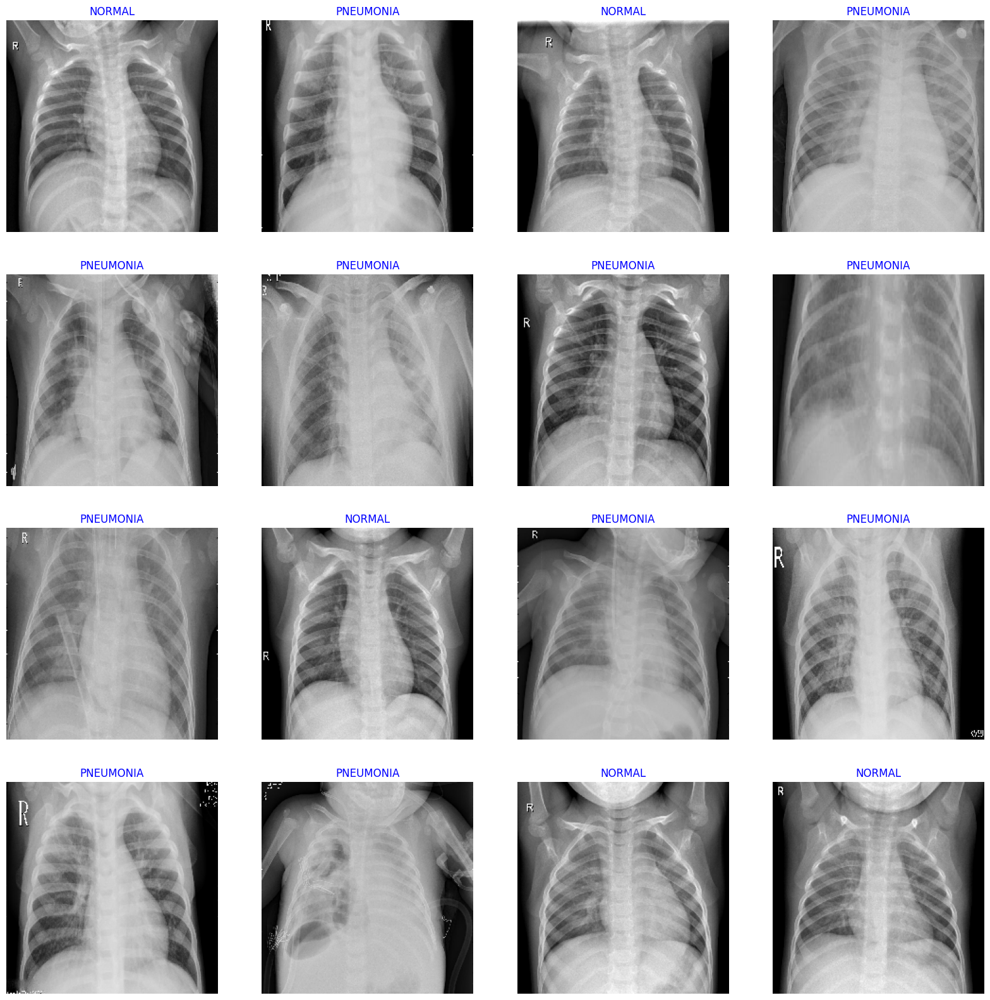

In [11]:
gen_dict = train_gen.class_indices
classes = list(gen_dict.keys())
images , labels = next(train_gen)

plt.figure(figsize= (20,20))

for i in range(16):
    plt.subplot(4,4,i+1)
    image = images[i] / 255
    plt.imshow(image)
    index = np.argmax(labels[i])
    class_name = classes[index]
    plt.title(class_name , color = 'blue' , fontsize= 12)
    plt.axis('off')
plt.show();

## **Model Structure**

In [12]:
img_size = (224, 224)
img_shape = (img_size[0] , img_size[1] , 3)
num_class = len(classes)
base_model = tf.keras.applications.efficientnet.EfficientNetB3(include_top = False , weights = 'imagenet',input_shape = img_shape, pooling= 'max')
model = Sequential([
    base_model,
    BatchNormalization(axis= -1 , momentum= 0.99 , epsilon= 0.001),
    Dense(256, kernel_regularizer = regularizers.l2(l= 0.016) , activity_regularizer = regularizers.l1(0.006),bias_regularizer= regularizers.l1(0.006) , activation = 'relu'),
    Dropout(rate= 0.4 , seed = 75),
    Dense(num_class , activation = 'softmax')
])
model.compile(Adamax(learning_rate = 0.0001) , loss = 'categorical_crossentropy', metrics = ['accuracy'])
model.summary()

43941136/43941136 [==============================] - 3s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization (Batch  (None, 1536)              6144      
 Normalization)                                                  
                                                                 
 dense (Dense)               (None, 256)               393472    
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 2)                 514       
                                                         

## **Model Training**

In [13]:
Epochs = 10
history = model.fit(x= train_gen , epochs = Epochs, verbose = 1, validation_data= valid_gen,validation_steps = None , shuffle = False)

Epoch 1/10


2024-04-17 12:09:54.434573: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential/efficientnetb3/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
I0000 00:00:1713355801.440158     101 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


261/261 [==============================] - 141s 320ms/step - loss: 7.7746 - accuracy: 0.8301 - val_loss: 7.3211 - val_accuracy: 0.8898
Epoch 2/10
261/261 [==============================] - 61s 232ms/step - loss: 6.7925 - accuracy: 0.9307 - val_loss: 6.6644 - val_accuracy: 0.8562
Epoch 3/10
261/261 [==============================] - 61s 232ms/step - loss: 6.0442 - accuracy: 0.9468 - val_loss: 5.7048 - val_accuracy: 0.9728
Epoch 4/10
261/261 [==============================] - 61s 232ms/step - loss: 5.3532 - accuracy: 0.9609 - val_loss: 5.0717 - val_accuracy: 0.9760
Epoch 5/10
261/261 [==============================] - 61s 232ms/step - loss: 4.7964 - accuracy: 0.9597 - val_loss: 4.5534 - val_accuracy: 0.9808
Epoch 6/10
261/261 [==============================] - 61s 234ms/step - loss: 4.3430 - accuracy: 0.9708 - val_loss: 4.1513 - val_accuracy: 0.9840
Epoch 7/10
261/261 [==============================] - 61s 232ms/step - loss: 3.9907 - accuracy: 0.9770 - val_loss: 3.8141 - val_accuracy: 0.

## **Evaluation**

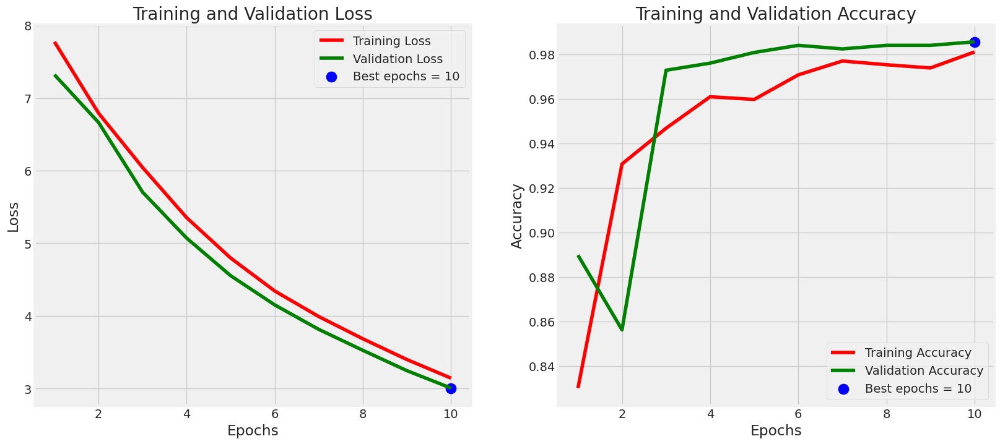

In [14]:
train_acc = history.history['accuracy']
train_loss = history.history['loss']

val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]

index_acc = np.argmax(val_acc)
val_highest = val_acc[index_acc]

Epochs = [i+1 for i in range(len(train_acc))]

loss_label = f'Best epochs = {str(index_loss +1)}'
acc_label = f'Best epochs = {str(index_acc + 1)}'

#Training history

plt.figure(figsize= (20,8))
plt.style.use('fivethirtyeight')

plt.subplot(1,2,1)
plt.plot(Epochs , train_loss , 'r' , label = 'Training Loss')
plt.plot(Epochs , val_loss , 'g' , label = 'Validation Loss')
plt.scatter(index_loss + 1 , val_lowest , s = 150 , c = 'blue',label = loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1,2,2)
plt.plot(Epochs , train_acc , 'r' , label = 'Training Accuracy')
plt.plot(Epochs , val_acc , 'g' , label = 'Validation Accuracy')
plt.scatter(index_acc + 1 , val_highest , s = 150 , c = 'blue',label = acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.tight_layout
plt.show();

In [15]:
train_score = model.evaluate(train_gen , steps =16 , verbose = 1)
valid_score = model.evaluate(valid_gen , steps = 16 , verbose = 1)
test_score = model.evaluate(test_gen , steps = 16 , verbose = 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

16/16 [==============================] - 4s 279ms/step - loss: 2.9894 - accuracy: 0.9961
Train Loss:  2.9808459281921387
Train Accuracy:  1.0
--------------------
Validation Loss:  3.026766777038574
Validation Accuracy:  0.9765625
--------------------
Test Loss:  2.9894115924835205
Test Accuracy:  0.99609375


## **Predictions**

In [16]:
preds = model.predict_generator(test_gen)
y_pred = np.argmax(preds , axis = 1)

## **Confusion matrix and Classification report**

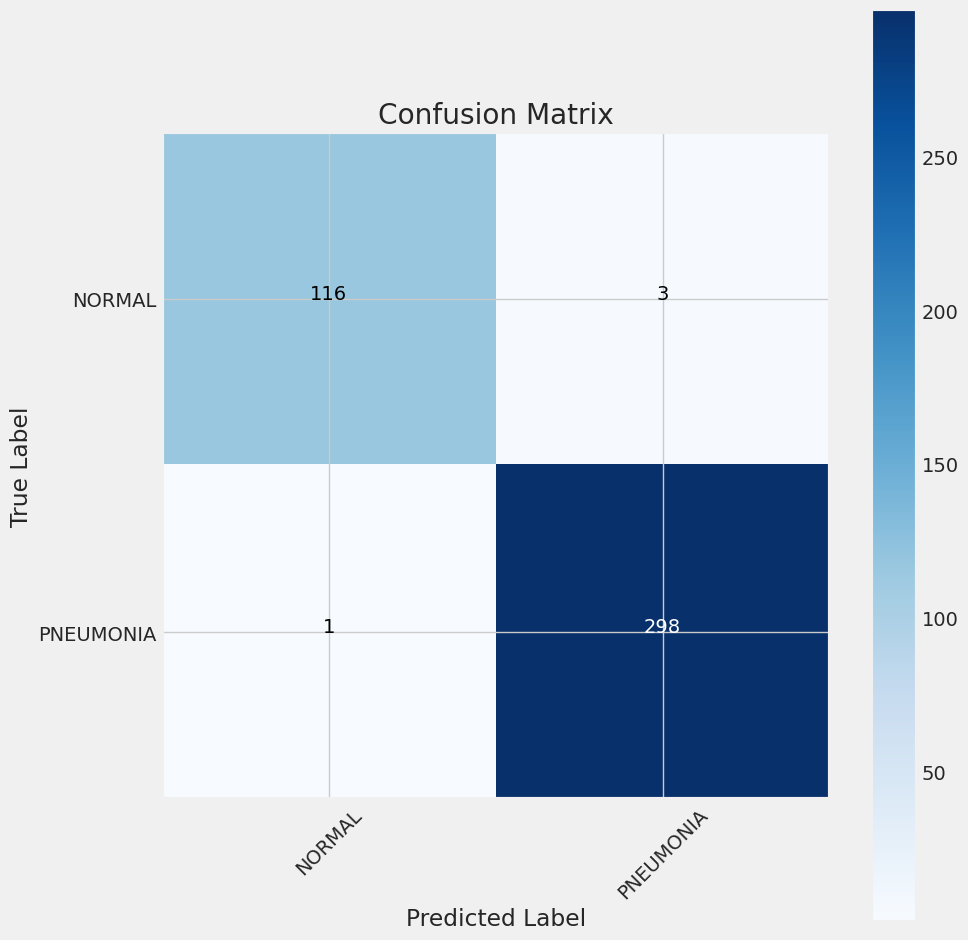

In [17]:
g_dict = test_gen.class_indices
classes = list(g_dict.keys())
cm = confusion_matrix(test_gen.classes, y_pred)

plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)


thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

In [18]:
print(classification_report(test_gen.classes, y_pred , target_names= classes ))

              precision    recall  f1-score   support

      NORMAL       0.99      0.97      0.98       119
   PNEUMONIA       0.99      1.00      0.99       299

    accuracy                           0.99       418
   macro avg       0.99      0.99      0.99       418
weighted avg       0.99      0.99      0.99       418



In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/.DS_Store
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/.DS_Store
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/person1947_bacteria_4876.jpeg
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/person1946_bacteria_4875.jpeg
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/person1952_bacteria_4883.jpeg
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/person1954_bacteria_4886.jpeg
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/person1951_bacteria_4882.jpeg
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/person1946_bacteria_4874.jpeg
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/person1949_bacteria_4880.jpeg
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/.DS_Store
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/per

In [2]:
# Basic libraries
import sys
import os
import gc
import time              
import pickle                
import numpy as np
import pandas as pd
from time import time

# Data visualization & printing libraries
from matplotlib import pyplot as plt
import seaborn as sb
from PIL import Image
from IPython.display import HTML, display
import tabulate

# Deep learning libraries
import tensorflow as tf
from keras import Model
from keras.models import Sequential, load_model
from keras.layers import Dense, Conv2D, MaxPooling2D, Dropout, BatchNormalization
from keras.layers import Flatten, Activation, Input, AveragePooling2D, Lambda, add
from keras.layers import concatenate
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array
from keras.utils import plot_model

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Utility functions
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.utils import shuffle

# Setting random seeds
np.random.seed(7)
tf.random.set_seed(7)

# Magic functions
%matplotlib inline

2024-04-16 19:08:54.556079: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-16 19:08:54.556204: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-16 19:08:54.688673: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [6]:
# Getting image paths and creating pandas dataframe for each dataset (train/val/test)

train_p = [('../input/chest-xray-pneumonia/chest_xray/train/PNEUMONIA/' + filename,1) for count, filename in enumerate(os.listdir('../input/chest-xray-pneumonia/chest_xray/train/PNEUMONIA'))]
train_n = [('../input/chest-xray-pneumonia/chest_xray/train/NORMAL/' + filename,0) for count, filename in enumerate(os.listdir('../input/chest-xray-pneumonia/chest_xray/train/NORMAL'))]
val_p = [('../input/chest-xray-pneumonia/chest_xray/val/PNEUMONIA/' + filename,1) for count, filename in enumerate(os.listdir('../input/chest-xray-pneumonia/chest_xray/val/PNEUMONIA'))]
val_n = [('../input/chest-xray-pneumonia/chest_xray/val/NORMAL/' + filename,0) for count, filename in enumerate(os.listdir('../input/chest-xray-pneumonia/chest_xray/val/NORMAL'))]
test_p = [('../input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/' + filename,1) for count, filename in enumerate(os.listdir('../input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA'))]
test_n = [('../input/chest-xray-pneumonia/chest_xray/test/NORMAL/' + filename,0) for count, filename in enumerate(os.listdir('../input/chest-xray-pneumonia/chest_xray/test/NORMAL'))]

train_data = pd.DataFrame(train_p+train_n, columns=['image_path', 'label'],index=None)
val_data = pd.DataFrame(val_p+val_n, columns=['image_path', 'label'],index=None)
test_data = pd.DataFrame(test_p+test_n, columns=['image_path', 'label'],index=None)

# Data Augmentation

In [10]:
# Creating a dataframe for image properties.

l = []
path_list = train_p + train_n + val_p + val_n + test_p + test_n
for i in path_list:
    with Image.open(i[0]) as image_temp:
        l.append(list(np.asarray(image_temp).shape))
imgs_size_df = pd.DataFrame(l, columns=['height', 'width', 'channels'], index=None)
imgs_size_df['channels'].fillna(1, inplace=True)  # Modified line to address FutureWarning


/tmp/ipykernel_34/640050885.py:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  imgs_size_df['channels'].fillna(1, inplace=True)  # Modified line to address FutureWarning


Image size: (516, 895, 3)


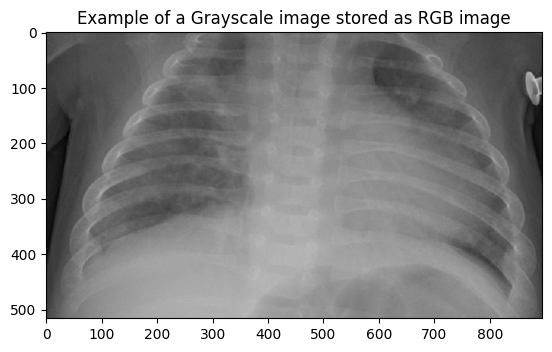

In [11]:
# Example of B&W image stored in RGB format

img = Image.open(path_list[imgs_size_df.query('channels==3').index[0]][0])
plt.imshow(img)
plt.title('Example of a Grayscale image stored as RGB image')
print('Image size:', np.asarray(img).shape)

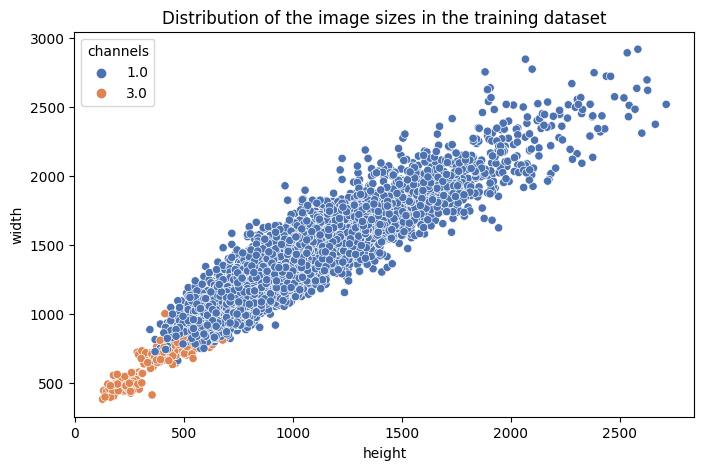

In [12]:
plt.figure(figsize=(8,5))
sb.scatterplot(data=imgs_size_df, x='height', y='width', hue='channels', palette="deep")
plt.title('Distribution of the image sizes in the training dataset');

In [13]:
imgs_size_df.fillna(value=int(1), inplace=True)
imgs_size_df.query('channels==3').head()
print('There are', imgs_size_df.query('channels==3').shape[0], 'B&W images stored in RGB format.')

There are 283 B&W images stored in RGB format.


In [14]:
# Resizing all the images: New size 256x256

direct_lists=[train_p,train_n,val_p,val_n,test_p,test_n]
save_paths=['/kaggle/working/modified/train/PNEUMONIA/',
            '/kaggle/working/modified/train/NORMAL/',
            '/kaggle/working/modified/val/PNEUMONIA/',
            '/kaggle/working/modified/val/NORMAL/',
            '/kaggle/working/modified/test/PNEUMONIA/',
            '/kaggle/working/modified/test/NORMAL/']

for path in save_paths:
    os.makedirs(path)

In [15]:
save_prefix=['train_pneumonial','train_normal','val_pneumonial','val_normal','test_pneumonial','test_normal']
for direct,save_path,prefix in zip(direct_lists,save_paths, save_prefix):
    i=1
    for path in direct:
        with Image.open(path[0]) as img_temp:
            resized_gray = img_temp.resize((256,256)).convert('L')
            resized_gray.save(save_path+prefix+'_'+str(i)+'.jpg')
        i+=1

In [16]:
# Modified image paths

train_p = [('/kaggle/working/modified/train/PNEUMONIA/' + filename,1) for count, filename in enumerate(os.listdir('/kaggle/working/modified/train/PNEUMONIA/'))]
train_n = [('/kaggle/working/modified/train/NORMAL/' + filename,0) for count, filename in enumerate(os.listdir('/kaggle/working/modified/train/NORMAL/'))]
val_p = [('/kaggle/working/modified/val/PNEUMONIA/' + filename,1) for count, filename in enumerate(os.listdir('/kaggle/working/modified/val/PNEUMONIA/'))]
val_n = [('/kaggle/working/modified/val/NORMAL/' + filename,0) for count, filename in enumerate(os.listdir('/kaggle/working/modified/val/NORMAL/'))]
test_p = [('/kaggle/working/modified/test/PNEUMONIA/' + filename,1) for count, filename in enumerate(os.listdir('/kaggle/working/modified/test/PNEUMONIA/'))]
test_n = [('/kaggle/working/modified/test/NORMAL/' + filename,0) for count, filename in enumerate(os.listdir('/kaggle/working/modified/test/NORMAL/'))]

train_data = pd.DataFrame(train_p+train_n, columns=['image', 'label'],index=None)
val_data = pd.DataFrame(val_p+val_n, columns=['image', 'label'],index=None)
test_data = pd.DataFrame(test_p+test_n, columns=['image', 'label'],index=None)

In [17]:
l=[]
paths = train_p+train_n+val_p+val_n+test_p+test_n
for i in paths:
    with Image.open(i[0]) as image_temp:
        l.append(list(np.asarray(image_temp).shape))
imgs_size_df = pd.DataFrame(l, columns=['height', 'width'],index=None)

In [18]:
print('All the images are now of size',imgs_size_df.height.value_counts().index[0],
      'x',imgs_size_df.width.value_counts().index[0],'x 1')

All the images are now of size 256 x 256 x 1


In [19]:
# Creating an image generator

ImageGen = ImageDataGenerator(
    rotation_range=10,
    brightness_range=[0.9,1.1],
    zoom_range = 0.15,
    width_shift_range=0.1, 
    height_shift_range=0.1,
    horizontal_flip=False,
    vertical_flip=False,
    fill_mode="nearest"
)

In [20]:
# Function that generates and save images by batch and up to a certain threshold.

def GenerateImages(data, save_dir, b_size, max_size):
    img_array_list=[]
    for path in data:
        with Image.open(path[0]) as image_temp:
            img_array = img_to_array(image_temp)
            img_array = img_array.reshape((1,)+img_array.shape)
            img_array_list.append(img_array)
    img_array_list = np.concatenate(img_array_list, axis=0)
    i=0
    for batch in ImageGen.flow(img_array_list, batch_size=b_size,
                            save_to_dir='/kaggle/working/modified/'+save_dir,
                            save_prefix='Aug', save_format='JPEG'):
        i+=1
        if i>(max_size-len(data))//b_size:
            break

In [21]:
os.makedirs('/kaggle/working/modified/train/AUGMENTED/PNEUMONIA')
os.makedirs('/kaggle/working/modified/train/AUGMENTED/NORMAL')
os.makedirs('/kaggle/working/modified/val/AUGMENTED/PNEUMONIA')
os.makedirs('/kaggle/working/modified/val/AUGMENTED/NORMAL')

In [22]:
# Generating train and validation data

GenerateImages(train_p, 'train/AUGMENTED/PNEUMONIA', 16, 8000)
GenerateImages(train_n, 'train/AUGMENTED/NORMAL', 16, 8000)
GenerateImages(val_p, 'val/AUGMENTED/PNEUMONIA', 8, 400)
GenerateImages(val_n, 'val/AUGMENTED/NORMAL', 8, 400)

In [23]:
# Getting the augmented data paths and adding them to the old ones

train_p_aug = [('/kaggle/working/modified/train/AUGMENTED/PNEUMONIA/' + filename,1) for count, filename in enumerate(os.listdir('/kaggle/working/modified/train/AUGMENTED/PNEUMONIA'))]
train_p = train_p + train_p_aug
train_n_aug = [('/kaggle/working/modified/train/AUGMENTED/NORMAL/' + filename,0) for count, filename in enumerate(os.listdir('/kaggle/working/modified/train/AUGMENTED/NORMAL'))]
train_n = train_n + train_n_aug

val_p_aug = [('/kaggle/working/modified/val/AUGMENTED/PNEUMONIA/' + filename,1) for count, filename in enumerate(os.listdir('/kaggle/working/modified/val/AUGMENTED/PNEUMONIA'))]
val_p = val_p + val_p_aug
val_n_aug = [('/kaggle/working/modified/val/AUGMENTED/NORMAL/' + filename,0) for count, filename in enumerate(os.listdir('/kaggle/working/modified/val/AUGMENTED/NORMAL'))]
val_n = val_n + val_n_aug

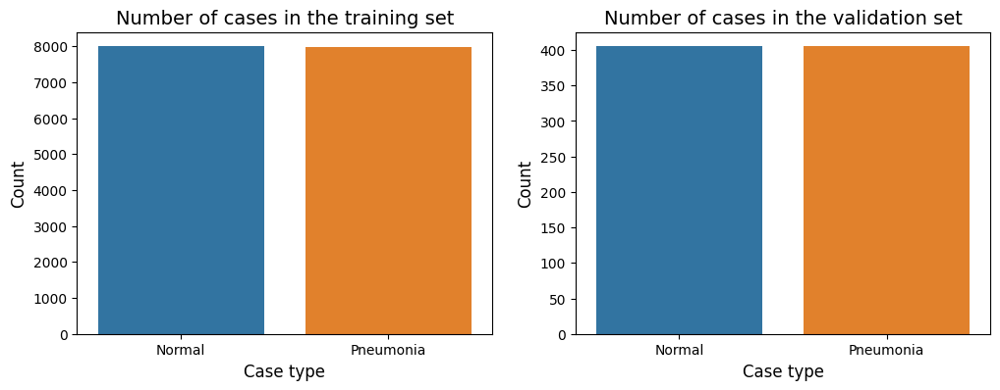

In [24]:
train_data = pd.DataFrame(train_p+train_n, columns=['image', 'label'],index=None)
val_data = pd.DataFrame(val_p+val_n, columns=['image', 'label'],index=None)
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
sb.countplot(data= train_data, x='label')
plt.title('Number of cases in the training set', fontsize=14)
plt.xlabel('Case type', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(range(len(train_data.label.unique())), ['Normal', 'Pneumonia'])

plt.subplot(1,2,2)
sb.countplot(data= val_data, x='label')
plt.title('Number of cases in the validation set', fontsize=14)
plt.xlabel('Case type', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(range(len(train_data.label.unique())), ['Normal', 'Pneumonia']);

In [25]:
Train_data=[]
Train_label=[]
for path in train_n+train_p:
    with Image.open(path[0]) as image_temp:
        img_array = img_to_array(image_temp)
        img_array = (img_array-img_array.mean())/img_array.std()
        img_array = img_array.reshape((1,)+img_array.shape)
        Train_data.append(img_array)
    Train_label.append(path[1])
Train_data = np.concatenate(Train_data, axis=0)
Train_label = np.array(Train_label)

Val_data=[]
Val_label=[]
for path in val_n+val_p:
    with Image.open(path[0]) as image_temp:
        img_array = img_to_array(image_temp)
        img_array = (img_array-img_array.mean())/img_array.std()
        img_array = img_array.reshape((1,)+img_array.shape)
        Val_data.append(img_array)
    Val_label.append(path[1])
Val_data = np.concatenate(Val_data, axis=0)
Val_label = np.array(Val_label)

Test_data=[]
Test_label=[]
for path in test_n+test_p:
    with Image.open(path[0]) as image_temp:
        img_array = img_to_array(image_temp)
        img_array = (img_array-img_array.mean())/img_array.std()
        img_array = img_array.reshape((1,)+img_array.shape)
        Test_data.append(img_array)
    Test_label.append(path[1])
Test_data = np.concatenate(Test_data, axis=0)
Test_label = np.array(Test_label)

In [26]:
Train_data, Train_label = shuffle(Train_data, Train_label, random_state=7)
Val_data, Val_label = shuffle(Val_data, Val_label, random_state=7)
Test_data, Test_label = shuffle(Test_data, Test_label, random_state=7)

# VGG ARCHITECTURE

In [27]:
VGG_model = Sequential(name='VGG_model')
VGG_model.add(Conv2D(16,(3,3), strides=1, padding='same', activation='relu', kernel_initializer='he_normal',
                       input_shape=(256,256,1) ))
VGG_model.add(MaxPooling2D((2,2), padding='same'))

VGG_model.add(Conv2D(32,(3,3), strides=1, padding='same', activation='relu', kernel_initializer='he_normal' ))
VGG_model.add(Conv2D(32,(3,3), strides=1, padding='same', activation='relu', kernel_initializer='he_normal' ))
VGG_model.add(BatchNormalization())
VGG_model.add(MaxPooling2D((2,2), strides=2 ,padding='same'))

VGG_model.add(Conv2D(64,(3,3), strides=1, padding='same', activation='relu', kernel_initializer='he_normal' ))
VGG_model.add(Conv2D(64,(3,3), strides=1, padding='same', activation='relu', kernel_initializer='he_normal' ))
VGG_model.add(BatchNormalization())
VGG_model.add(MaxPooling2D((2,2), strides=2 ,padding='same'))

VGG_model.add(Conv2D(128,(3,3), strides=1, padding='same', activation='relu', kernel_initializer='he_normal' ))
VGG_model.add(Conv2D(128,(3,3), strides=1, padding='same', activation='relu', kernel_initializer='he_normal' ))
VGG_model.add(BatchNormalization())
VGG_model.add(MaxPooling2D((2,2), strides=2 ,padding='same'))

VGG_model.add(Flatten())

VGG_model.add(Dense(8, activation='relu', kernel_initializer='he_normal'))
VGG_model.add(Dropout(0.15))
VGG_model.add(Dense(1, activation="sigmoid"))

VGG_model.compile(optimizer = 'adam', loss='binary_crossentropy', metrics=['accuracy'])

VGG_model.summary()


Model: "VGG_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 256, 16)      160       
                                                                 
 max_pooling2d (MaxPooling2  (None, 128, 128, 16)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 32)      4640      
                                                                 
 conv2d_2 (Conv2D)           (None, 128, 128, 32)      9248      
                                                                 
 batch_normalization (Batch  (None, 128, 128, 32)      128       
 Normalization)                                                  
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 64, 64, 32)        0 

After some tuning of the hyper parameters, we've found that the follwoing ones gave the best results.

In [29]:
callback = ReduceLROnPlateau(monitor='val_loss', patience = 3, cooldown=0, verbose=1, factor=0.6, min_lr=0.000001)
start_vgg = time()
VGG_results = VGG_model.fit(
    x=Train_data,
    y=Train_label,
    batch_size=16,
    validation_data=(Val_data,Val_label),
    class_weight={0:12, 1:0.5},
    epochs=20, callbacks=[callback])
end_vgg = time()
vgg_train_dur = end_vgg - start_vgg

Epoch 1/20


I0000 00:00:1713294840.254897     118 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1000/1000 [==============================] - 44s 33ms/step - loss: 0.8122 - accuracy: 0.5096 - val_loss: 0.6569 - val_accuracy: 0.5000 - lr: 0.0010
Epoch 2/20
1000/1000 [==============================] - 31s 31ms/step - loss: 0.5425 - accuracy: 0.5123 - val_loss: 0.6288 - val_accuracy: 0.5086 - lr: 0.0010
Epoch 3/20
1000/1000 [==============================] - 31s 31ms/step - loss: 0.4929 - accuracy: 0.5223 - val_loss: 1.0119 - val_accuracy: 0.5012 - lr: 0.0010
Epoch 4/20
1000/1000 [==============================] - 30s 30ms/step - loss: 0.4573 - accuracy: 0.5350 - val_loss: 0.8503 - val_accuracy: 0.5000 - lr: 0.0010
Epoch 5/20
 999/1000 [============================>.] - ETA: 0s - loss: 0.4758 - accuracy: 0.5235
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0006000000284984708.
1000/1000 [==============================] - 30s 30ms/step - loss: 0.4758 - accuracy: 0.5235 - val_loss: 6.2721 - val_accuracy: 0.6395 - lr: 0.0010
Epoch 6/20
1000/1000 [==============================]

**RESULTS**

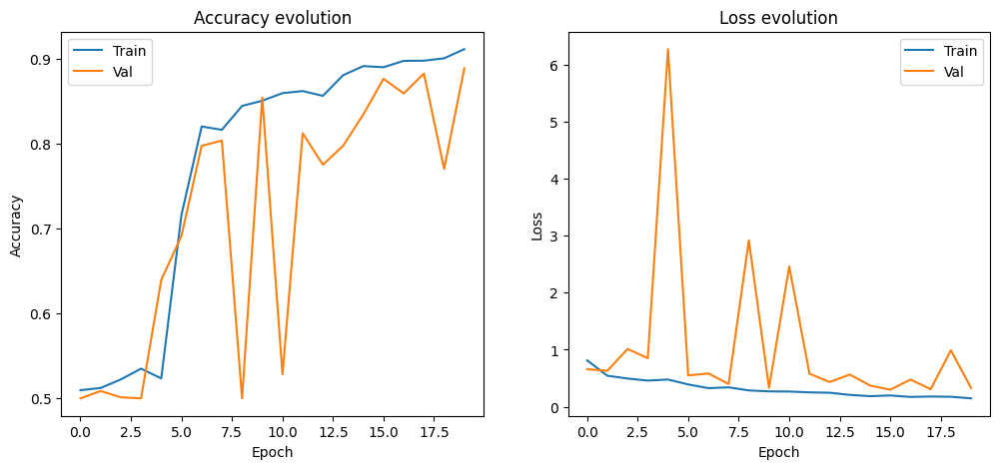

In [30]:
plt.figure(figsize=(12,5))
plt.subplot(121)
plt.plot(VGG_results.history['accuracy'])
plt.plot(VGG_results.history['val_accuracy'])
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train','Val'])
plt.title('Accuracy evolution')

plt.subplot(122)
plt.plot(VGG_results.history['loss'])
plt.plot(VGG_results.history['val_loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train','Val'])
plt.title('Loss evolution');

In [31]:
print('Classification report:')
VGG_pred = VGG_model.predict(Test_data)
print(classification_report(VGG_pred.round(),Test_label))

Classification report:
20/20 [==============================] - 2s 13ms/step
              precision    recall  f1-score   support

         0.0       0.85      0.91      0.88       218
         1.0       0.95      0.91      0.93       406

    accuracy                           0.91       624
   macro avg       0.90      0.91      0.91       624
weighted avg       0.92      0.91      0.91       624



In [32]:
VGG_train_loss = VGG_results.history['loss']
VGG_val_loss = VGG_results.history['val_loss']
VGG_train_acc = VGG_results.history['accuracy']
VGG_val_acc = VGG_results.history['val_accuracy']

VGG_rep = classification_report(VGG_pred.round(),Test_label, output_dict=True)

Freeing up memory to be able to train next model

In [33]:
del VGG_model
del VGG_results
gc.collect()

9000

# INCEPTION ARCHITECTURE

In [34]:
# Creating the inception module

def inception_module(layer_input, fb1, fb2_in, fb2_out, fb3_in, fb3_out, fb4_out):

    conv1 = Conv2D(fb1, (1,1), padding='same', activation='relu', kernel_initializer='he_normal')(layer_input)

    conv3 = Conv2D(fb2_in, (1,1), padding='same', activation='relu', kernel_initializer='he_normal')(layer_input)
    conv3 = Conv2D(fb2_out, (3,3), padding='same', activation='relu', kernel_initializer='he_normal')(conv3)

    conv5 = Conv2D(fb3_in, (1,1), padding='same', activation='relu', kernel_initializer='he_normal')(layer_input)
    conv5 = Conv2D(fb3_out, (5,5), padding='same', activation='relu', kernel_initializer='he_normal')(conv5)

    pool = MaxPooling2D((3,3), strides=(1,1), padding='same')(layer_input)
    pool = Conv2D(fb4_out, (1,1), padding='same', activation='relu', kernel_initializer='he_normal')(pool)

    layer_output = concatenate([conv1, conv3, conv5, pool], axis=-1)
    return layer_output

In [35]:
visible = Input(shape=(256,256,1))

layer = Conv2D(32, (7,7), strides=2, padding='same', activation='relu', kernel_initializer='he_normal' )(visible)
layer = MaxPooling2D((3,3), strides=(2,2))(layer)
layer = Lambda(tf.nn.local_response_normalization)(layer)
layer = Conv2D(32, (3,3), strides=1, padding='same', activation='relu', kernel_initializer='he_normal' )(layer)
layer = MaxPooling2D((3,3), strides=(2,2))(layer)
layer = inception_module(layer, 32, 64, 64, 16, 32, 32)
layer = inception_module(layer, 32, 64, 64, 16, 32, 32)
layer = MaxPooling2D((3,3), strides=(2,2), padding='same')(layer)
layer = Conv2D(32, (3,3), strides=1, padding='same', activation='relu', kernel_initializer='he_normal' )(layer)
layer = AveragePooling2D((3,3), padding='valid')(layer)
layer = Flatten()(layer)
layer = Dense(4, activation='relu', kernel_initializer='he_normal')(layer)
layer = Dense(1, activation='sigmoid')(layer)

Inception_model = Model(inputs=visible, outputs=layer, name='Inception_model')

Inception_model.summary()

Model: "Inception_model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 conv2d_7 (Conv2D)           (None, 128, 128, 32)         1600      ['input_1[0][0]']             
                                                                                                  
 max_pooling2d_4 (MaxPoolin  (None, 63, 63, 32)           0         ['conv2d_7[0][0]']            
 g2D)                                                                                             
                                                                                                  
 lambda (Lambda)             (None, 63, 63, 32)           0         ['max_pooling2d_

In [37]:
Inception_model.compile(optimizer = 'adam', loss='binary_crossentropy', metrics=['accuracy'])
callback = ReduceLROnPlateau(monitor='val_loss', patience = 3, cooldown=0, verbose=1, factor=0.6, min_lr=0.000001)
start_inception = time()
results_inception = Inception_model.fit(
    x=Train_data,
    y=Train_label,
    batch_size=16,
    validation_data=(Val_data,Val_label),
    class_weight={0:12, 1:0.5},
    epochs=15, callbacks=[callback])
end_inception = time()
inception_train_dur = end_inception - start_inception

Epoch 1/15
1000/1000 [==============================] - 29s 22ms/step - loss: 0.5522 - accuracy: 0.7153 - val_loss: 0.5358 - val_accuracy: 0.7914 - lr: 0.0010
Epoch 2/15
1000/1000 [==============================] - 20s 20ms/step - loss: 0.3426 - accuracy: 0.8689 - val_loss: 1.3339 - val_accuracy: 0.5654 - lr: 0.0010
Epoch 3/15
1000/1000 [==============================] - 20s 20ms/step - loss: 0.3225 - accuracy: 0.8648 - val_loss: 0.5336 - val_accuracy: 0.7741 - lr: 0.0010
Epoch 4/15
1000/1000 [==============================] - 20s 20ms/step - loss: 0.2423 - accuracy: 0.9079 - val_loss: 0.5487 - val_accuracy: 0.7840 - lr: 0.0010
Epoch 5/15
1000/1000 [==============================] - 20s 20ms/step - loss: 0.2058 - accuracy: 0.9230 - val_loss: 0.6538 - val_accuracy: 0.7469 - lr: 0.0010
Epoch 6/15
1000/1000 [==============================] - 20s 20ms/step - loss: 0.1815 - accuracy: 0.9354 - val_loss: 0.2977 - val_accuracy: 0.8938 - lr: 0.0010
Epoch 7/15
1000/1000 [========================

**RESULTS**

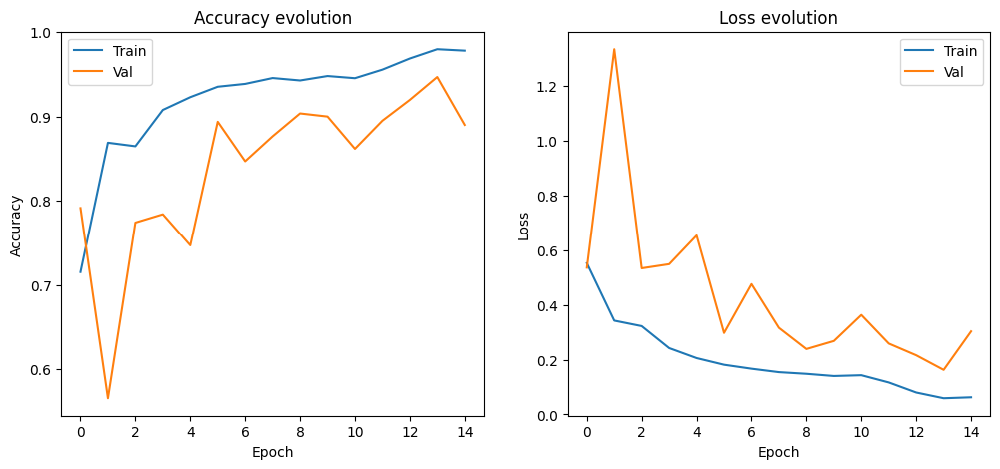

In [38]:
plt.figure(figsize=(12,5))
plt.subplot(121)
plt.plot(results_inception.history['accuracy'])
plt.plot(results_inception.history['val_accuracy'])
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train','Val'])
plt.title('Accuracy evolution')

plt.subplot(122)
plt.plot(results_inception.history['loss'])
plt.plot(results_inception.history['val_loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train','Val'])
plt.title('Loss evolution');


In [39]:
print('Classification report:')
Inception_pred = Inception_model.predict(Test_data)
print(classification_report(Inception_pred.round(),Test_label))

Classification report:
20/20 [==============================] - 1s 12ms/step
              precision    recall  f1-score   support

         0.0       0.85      0.99      0.91       201
         1.0       0.99      0.91      0.95       423

    accuracy                           0.94       624
   macro avg       0.92      0.95      0.93       624
weighted avg       0.95      0.94      0.94       624



In [40]:
Inception_train_loss = results_inception.history['loss']
Inception_val_loss = results_inception.history['val_loss']
Inception_train_acc = results_inception.history['accuracy']
Inception_val_acc = results_inception.history['val_accuracy']

Inception_rep = classification_report(Inception_pred.round(),Test_label, output_dict=True)

Freeing up memory to be able to train next model

In [41]:
del Inception_model
del results_inception
gc.collect()

17805

# RESNET-18

In [42]:
# function that will use the identity if possible, otherwise a projection of the number of filters
# in the input does not match the n_filters argument.

def residual_module(layer_in, n_filters):
    
    merge_input = layer_in
    if layer_in.shape[-1] != n_filters[2]:
        merge_input = Conv2D(n_filters[2], (1,1), padding='same', activation='relu', kernel_initializer='he_normal')(layer_in)
        
    conv1 = Conv2D(n_filters[0], (1,1), padding='same', activation='relu', kernel_initializer='he_normal')(layer_in)
    conv2 = Conv2D(n_filters[1], (3,3), padding='same', activation='relu', kernel_initializer='he_normal')(conv1)
    conv3 = Conv2D(n_filters[2], (1,1), padding='same', activation='linear', kernel_initializer='he_normal')(conv2)
    
    layer_out = add([conv3, merge_input])
    layer_out = Activation('relu')(layer_out)
    
    return layer_out

In [43]:
visible = Input(shape=(256,256,1))

layer = Conv2D(32, (7,7), strides=(2,2) ,padding='same', activation='relu', kernel_initializer='he_normal')(visible)
layer = MaxPooling2D((2,2), strides=2 ,padding='same')(layer)
layer = residual_module(layer, [8,8,16])
layer = residual_module(layer, [8,8,16])
layer = BatchNormalization()(layer)
layer = residual_module(layer, [8,8,16])
layer = residual_module(layer, [8,8,16])
layer = BatchNormalization()(layer)
layer = residual_module(layer, [16,16,32])
layer = residual_module(layer, [16,16,32])
layer = BatchNormalization()(layer)
layer = residual_module(layer, [32,32,64])
layer = residual_module(layer, [32,32,64])
layer = AveragePooling2D((3,3), padding='valid')(layer)
layer = Flatten()(layer)
layer = Dense(16, activation='relu')(layer)
layer = Dropout(0.1)(layer)
layer = Dense(1, activation='sigmoid')(layer)

ResNet_model = Model(inputs=visible, outputs=layer, name='ResNet_model')

ResNet_model.summary()

Model: "ResNet_model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 conv2d_22 (Conv2D)          (None, 128, 128, 32)         1600      ['input_2[0][0]']             
                                                                                                  
 max_pooling2d_9 (MaxPoolin  (None, 64, 64, 32)           0         ['conv2d_22[0][0]']           
 g2D)                                                                                             
                                                                                                  
 conv2d_24 (Conv2D)          (None, 64, 64, 8)            264       ['max_pooling2d_9[0

In [45]:
ResNet_model.compile(optimizer = 'adam', loss='binary_crossentropy', metrics=['accuracy'])
callback = ReduceLROnPlateau(monitor='val_loss', patience = 2, cooldown=0, verbose=1, factor=0.6, min_lr=0.000001)
start_ResNet = time()
results_ResNet = ResNet_model.fit(
    x=Train_data,
    y=Train_label,
    batch_size=16,
    validation_data=(Val_data,Val_label),
    class_weight={0:20, 1:0.5},
    epochs=15, callbacks=[callback])
end_ResNet = time()
ResNet_train_dur = end_ResNet - start_ResNet

Epoch 1/15
1000/1000 [==============================] - 39s 28ms/step - loss: 1.2862 - accuracy: 0.6932 - val_loss: 0.8980 - val_accuracy: 0.6444 - lr: 0.0010
Epoch 2/15
1000/1000 [==============================] - 26s 26ms/step - loss: 0.4719 - accuracy: 0.7747 - val_loss: 0.9796 - val_accuracy: 0.6519 - lr: 0.0010
Epoch 3/15
1000/1000 [==============================] - 26s 26ms/step - loss: 0.4353 - accuracy: 0.7958 - val_loss: 0.4918 - val_accuracy: 0.7790 - lr: 0.0010
Epoch 4/15
1000/1000 [==============================] - 26s 26ms/step - loss: 0.3722 - accuracy: 0.8289 - val_loss: 0.5890 - val_accuracy: 0.7296 - lr: 0.0010
Epoch 5/15
 999/1000 [============================>.] - ETA: 0s - loss: 0.3409 - accuracy: 0.8450
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0006000000284984708.
1000/1000 [==============================] - 26s 26ms/step - loss: 0.3409 - accuracy: 0.8450 - val_loss: 0.5463 - val_accuracy: 0.7642 - lr: 0.0010
Epoch 6/15
1000/1000 [====================

**RESULTS**

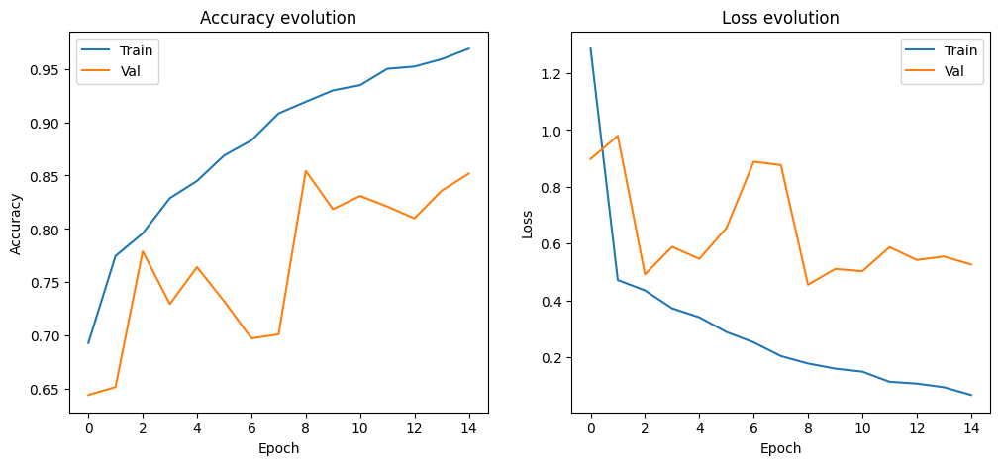

In [46]:
plt.figure(figsize=(12,5))
plt.subplot(121)
plt.plot(results_ResNet.history['accuracy'])
plt.plot(results_ResNet.history['val_accuracy'])
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train','Val'])
plt.title('Accuracy evolution')

plt.subplot(122)
plt.plot(results_ResNet.history['loss'])
plt.plot(results_ResNet.history['val_loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train','Val'])
plt.title('Loss evolution');

In [47]:
print('Classification report:')
ResNet_pred = ResNet_model.predict(Test_data)
print(classification_report(ResNet_pred.round(),Test_label))

Classification report:
20/20 [==============================] - 1s 16ms/step
              precision    recall  f1-score   support

         0.0       0.71      0.93      0.81       178
         1.0       0.97      0.85      0.90       446

    accuracy                           0.87       624
   macro avg       0.84      0.89      0.86       624
weighted avg       0.90      0.87      0.88       624



In [48]:
ResNet_train_loss = results_ResNet.history['loss']
ResNet_val_loss = results_ResNet.history['val_loss']
ResNet_train_acc = results_ResNet.history['accuracy']
ResNet_val_acc = results_ResNet.history['val_accuracy']

ResNet_rep = classification_report(ResNet_pred.round(),Test_label, output_dict=True)

In [49]:
del ResNet_model
del results_ResNet
gc.collect()

29946

# FINAL COMPARISON

Evolution of the validation Loss/Accuracy of the three trained models:

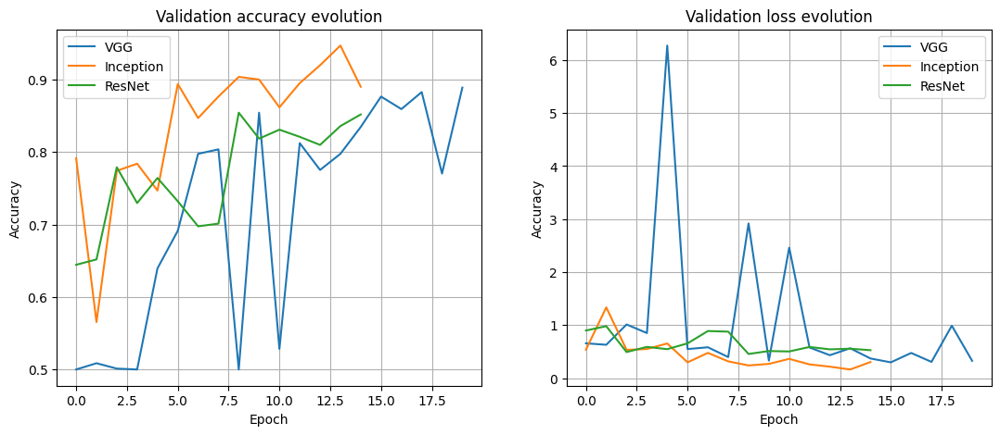

In [50]:
plt.figure(figsize=(13,5))

plt.subplot(121)
plt.plot(VGG_val_acc)
plt.plot(Inception_val_acc)
plt.plot(ResNet_val_acc)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['VGG','Inception','ResNet'])
plt.title('Validation accuracy evolution')
plt.grid(True)


plt.subplot(122)
plt.plot(VGG_val_loss)
plt.plot(Inception_val_loss)
plt.plot(ResNet_val_loss)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['VGG','Inception','ResNet'])
plt.title('Validation loss evolution')
plt.grid(True);

In [51]:
# Function to plot the confusion matrix of the trained model.

def plot_cm(mat,y_ture):
    df_cm = pd.DataFrame(mat, columns=np.unique(y_ture), index = np.unique(y_ture))
    df_cm.index.name = 'True Label'
    df_cm.columns.name = 'Predicted Label'
    sb.heatmap(df_cm, cmap="Blues", cbar=False, annot=True,annot_kws={"size": 10})
    plt.yticks(fontsize=10)
    plt.xticks(fontsize=10)

Normalized confusion matrix of each model

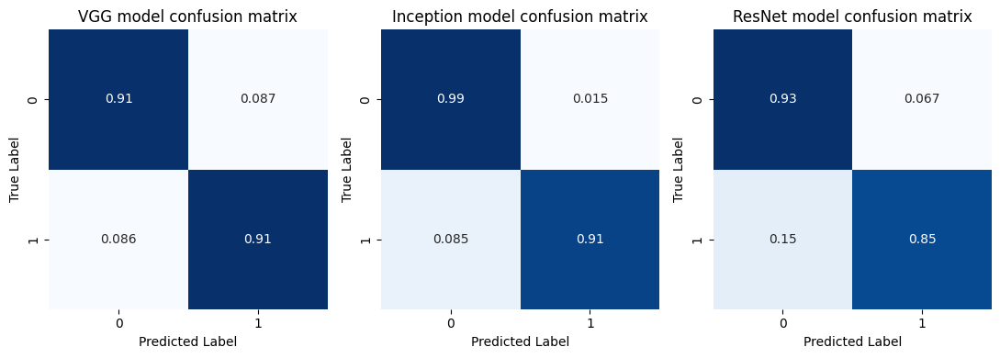

In [52]:
plt.figure(figsize=(11,4))
plt.subplot(131)
plot_cm(confusion_matrix(VGG_pred.round(),Test_label, normalize='true'), Test_label)
plt.title('VGG model confusion matrix')
plt.subplot(132)
plot_cm(confusion_matrix(Inception_pred.round(),Test_label, normalize='true'), Test_label)
plt.title('Inception model confusion matrix')
plt.subplot(133)
plot_cm(confusion_matrix(ResNet_pred.round(),Test_label, normalize='true'), Test_label)
plt.title('ResNet model confusion matrix')
plt.tight_layout()

Summary table of the three trained models results

In [53]:
vgg_acc = round(VGG_rep['accuracy'],2)
inception_acc = round(Inception_rep['accuracy'],2)
resnet_acc = round(ResNet_rep['accuracy'],2)

vgg_normal_f1 = round(VGG_rep['0.0']['f1-score'],2)
inception_normal_f1 = round(Inception_rep['0.0']['f1-score'],2)
resnet_normal_f1 = round(ResNet_rep['0.0']['f1-score'],2)

vgg_pneu_f1 = round(VGG_rep['1.0']['f1-score'],2)
inception_pneu_f1 = round(Inception_rep['1.0']['f1-score'],2)
resnet_pneu_f1 = round(ResNet_rep['1.0']['f1-score'],2)


print('Comparaison of model results:')

result_table=[['Model','Training epochs' ,'Training duration (min)', 'Test accuracy', '(Normal) F1-score', '(Pneumonia) F1-score'],
             ['VGG model', 20, round(vgg_train_dur/60), vgg_acc, vgg_normal_f1, vgg_pneu_f1],
             ['Inception model', 15,round(inception_train_dur/60), inception_acc, inception_normal_f1, inception_normal_f1],
             ['ResNet model ', 15,round(ResNet_train_dur/60), resnet_acc, resnet_normal_f1, resnet_pneu_f1]]

display(HTML(tabulate.tabulate(result_table, colalign=("center",)*6, tablefmt='html')))

Comparaison of model results:


Model,Training epochs,Training duration (min),Test accuracy,(Normal) F1-score,(Pneumonia) F1-score
VGG model,20,11,0.91,0.88,0.93
Inception model,15,5,0.94,0.91,0.91
ResNet model,15,8,0.87,0.81,0.9
